In [1]:
import tensorflow as tf
import tensorflow_hub as hub

import requests
from PIL import Image
from io import BytesIO

import matplotlib.pyplot as plt
import numpy as np

2023-09-12 18:50:58.461309: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-12 18:50:58.546039: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-12 18:50:58.547466: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-12 18:51:00.525552: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
def load_image_from_url(img_url, image_size):
    """Get the image from url. The image return has shape [1, height, width, num_channels]."""
    response = requests.get(img_url, headers={'User-agent': 'Colab Sample (https://tensorflow.org)'})
    image = Image.open(BytesIO(response.content))
    image = np.array(image)
    # reshape image
    img_reshaped = tf.reshape(image, [1, image.shape[0], image.shape[1], image.shape[2]])
    # Normalize by convert to float between [0, 1]
    image = tf.image.convert_image_dtype(img_reshaped, tf.float32)
    image_padded = tf.image.resize_with_pad(image, image_size, image_size)
    return image_padded, image

def show_image(image, title=''):
    image_size = image.shape[1]
    w = (image_size * 6) // 320
    plt.figure(figsize=(w, w))
    plt.imshow(image[0], aspect='equal')
    plt.axis('off')
    plt.title(title)
    plt.show()

Images will be converted to 330x330


2023-09-12 18:51:04.699644: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1960] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


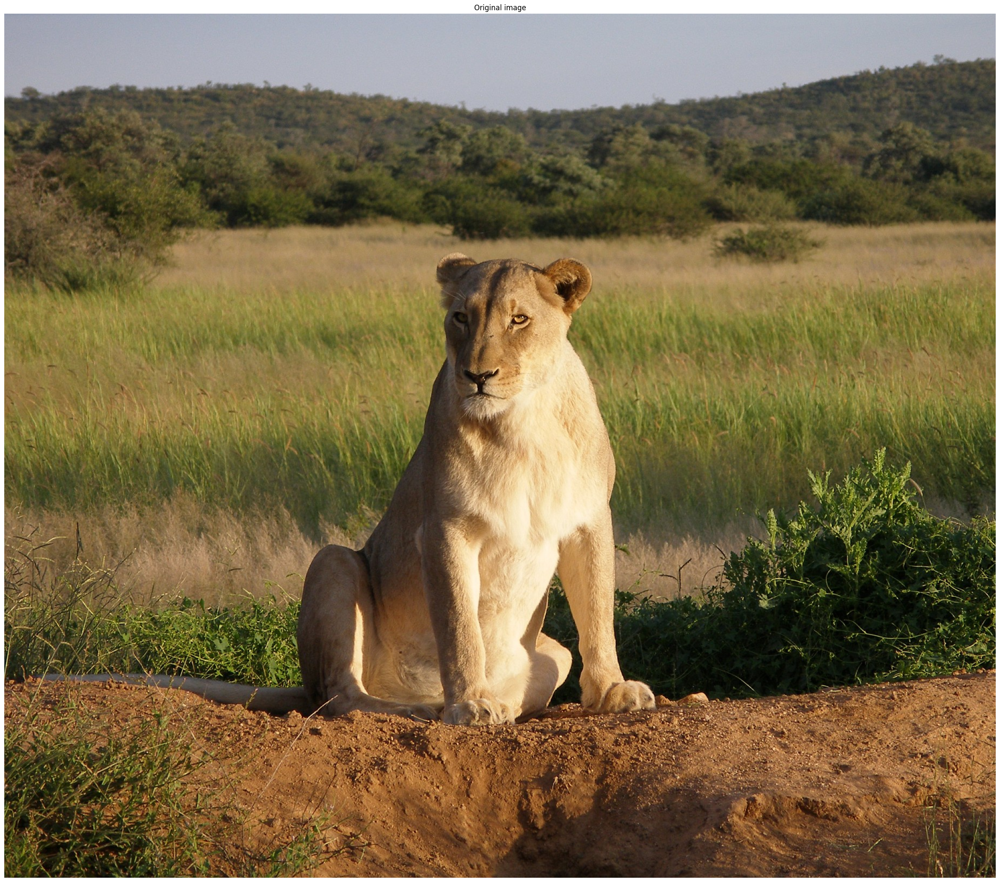

In [3]:
image_size = 330
print(f"Images will be converted to {image_size}x{image_size}")
img_url = "https://upload.wikimedia.org/wikipedia/commons/c/c6/Okonjima_Lioness.jpg"
image, original_image = load_image_from_url(img_url, image_size)
show_image(original_image, 'Original image')

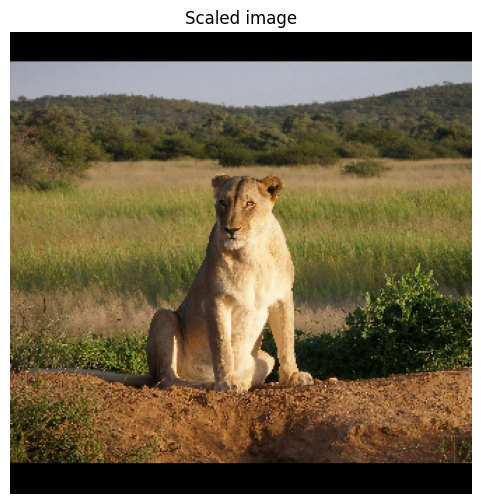

In [4]:
show_image(image, 'Scaled image')

In [5]:
labels_file = "https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt"

#download labels and creates a maps
downloaded_file = tf.keras.utils.get_file("labels.txt", origin=labels_file)

classes = []
with open(downloaded_file) as f:
    labels = f.readlines()
    classes = [l.strip() for l in labels]

In [6]:
classifier = hub.load("https://tfhub.dev/tensorflow/efficientnet/b2/classification/1")

In [7]:
probabilities = tf.nn.softmax(classifier(image)).numpy()

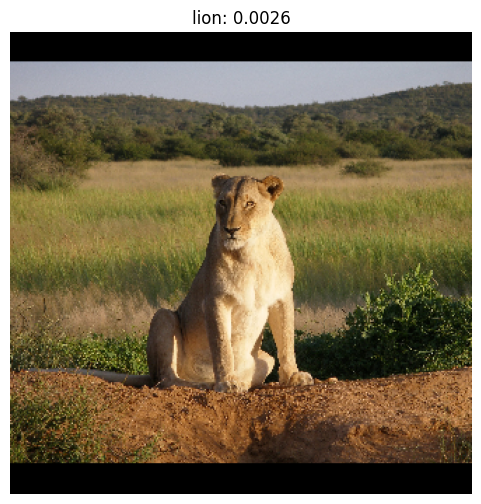

In [8]:
top_5 = tf.argsort(probabilities, axis=-1, direction="DESCENDING")[0][:5].numpy()

show_image(image, f'{classes[top_5[0]+1]}: {probabilities[0][top_5][0]:.4f}')

---